# Inside Airbnb NYC Data Analysis

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn.externals import joblib
#from sklearn.cross_validation import StratifiedKFold
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.metrics import make_scorer, f1_score, roc_auc_score

import json
import xgboost

import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

import shap
import warnings

import langid

warnings.filterwarnings("ignore")
%matplotlib inline

/data/timma/anaconda3/lib/python3.6/site-packages/sklearn/ensemble/weight_boosting.py:29: DeprecationWarning:

numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.



## 1. Business Understanding

As a solo adventurer who love travelling, I would like to explore and find insights about living in the famous New York City from Inside Airbnb dataset.

Three questions I am interested to get decent answers are below:

* Q1: The difference between locations and neighbourhoods for living in Airbnb Homes NYC.

* Q2: How much time in advance should I book an Airbnb if planing to visit NYC?

* Q3: What are the key features that affects the price of Airbnb NYC properties and how they impact each other?

-----
## 2. Data Understanding

In this project, I used following data files at `2019-03-06`:

* **listings.csv**: Detailed Listings data for Airbnb NYC;
* **calendar.csv**: Detailed Calendar Data for listings in NYC;
* **neighbourhoods.geojson**: GeoJSON file of neighbourhoods of NYC.

In [2]:
df_lst = pd.read_csv('listings.csv')
df_lst.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,...,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,2539,https://www.airbnb.com/rooms/2539,20190306152833,2019-03-07,Clean & quiet apt home by the park,Renovated apt home in elevator building.,"Spacious, renovated, and clean apt home, one b...",Renovated apt home in elevator building. Spaci...,none,Close to Prospect Park and Historic Ditmas Park,...,f,f,moderate,f,f,6,0,5,1,0.23
1,2595,https://www.airbnb.com/rooms/2595,20190306152833,2019-03-07,Skylit Midtown Castle,"Find your romantic getaway to this beautiful, ...","- Spacious (500+ft²), immaculate and nicely fu...","Find your romantic getaway to this beautiful, ...",none,Centrally located in the heart of Manhattan ju...,...,f,f,strict_14_with_grace_period,t,t,2,1,0,1,0.38
2,3330,https://www.airbnb.com/rooms/3330,20190306152833,2019-03-07,++ Brooklyn Penthouse Guestroom ++,"This is a spacious, clean, furnished master be...","Room Features: - clean, hardwood floors - 2 la...","This is a spacious, clean, furnished master be...",none,Location is GREAT!! Right off the L train in t...,...,f,f,strict_14_with_grace_period,f,f,3,0,3,0,0.35
3,3647,https://www.airbnb.com/rooms/3647,20190306152833,2019-03-07,THE VILLAGE OF HARLEM....NEW YORK !,NaN,WELCOME TO OUR INTERNATIONAL URBAN COMMUNITY T...,WELCOME TO OUR INTERNATIONAL URBAN COMMUNITY T...,none,NaN,...,f,f,strict_14_with_grace_period,t,t,1,0,1,0,NaN
4,3831,https://www.airbnb.com/rooms/3831,20190306152833,2019-03-07,Cozy Entire Floor of Brownstone,Urban retreat: enjoy 500 s.f. floor in 1899 br...,Greetings! We own a double-duplex brownst...,Urban retreat: enjoy 500 s.f. floor in 1899 br...,none,Just the right mix of urban center and local n...,...,f,f,moderate,f,f,1,1,0,0,4.43


In [3]:
df_cal = pd.read_csv('calendar.csv')
df_cal.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,36647,2019-03-07,f,$69.00,$69.00,2.0,730.0
1,36647,2019-03-08,f,$69.00,$69.00,2.0,730.0
2,36647,2019-03-09,f,$69.00,$69.00,2.0,730.0
3,36647,2019-03-10,f,$69.00,$69.00,2.0,730.0
4,36647,2019-03-11,f,$69.00,$69.00,2.0,730.0


In [4]:
with open('neighbourhoods.geojson') as json_file:  
    neighbourhoods = json.load(json_file)

type(neighbourhoods),len(neighbourhoods['features']),neighbourhoods['features'][0]['properties']

(dict, 233, {'neighbourhood': 'Bayswater', 'neighbourhood_group': 'Queens'})

-----
## 3. Data Preparation

The main steps to clean data before modeling:

* Drop useless columns;
* Convert **`string`** values to **`int`** if needed; (i.e.: price)
* Extract usefull info from text columns into separate columns; (i.e.: transit, amenities)
* Find all **`category`** columns and apply one-hot encoding;
* Delete outlier data based on label column(price).

In [5]:
df = df_lst.copy()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49748 entries, 0 to 49747
Columns: 106 entries, id to reviews_per_month
dtypes: float64(22), int64(21), object(63)
memory usage: 40.2+ MB


(-1, 350)

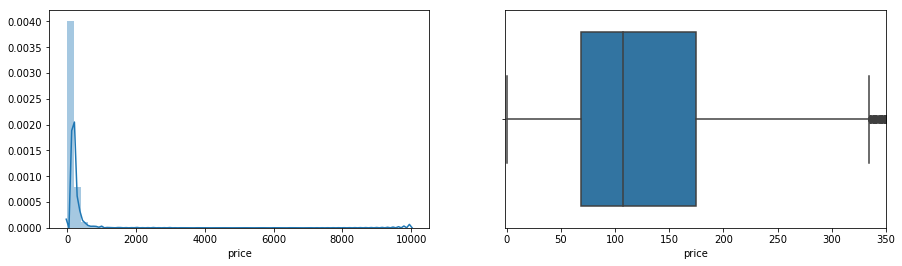

In [6]:
df['price'] = df['price'].apply(lambda x:float(str(x).replace(',','').replace('$','')))
f,ax = plt.subplots(1,2,figsize=(15,4))

ax = plt.subplot(1,2,1)
sns.distplot(df['price'],ax=ax)

ax = plt.subplot(1,2,2)
sns.boxplot(df['price'],ax=ax)
plt.xlim([-1,350])

### Q1: What are the difference between locations?

#### Q1.1: General Differences:

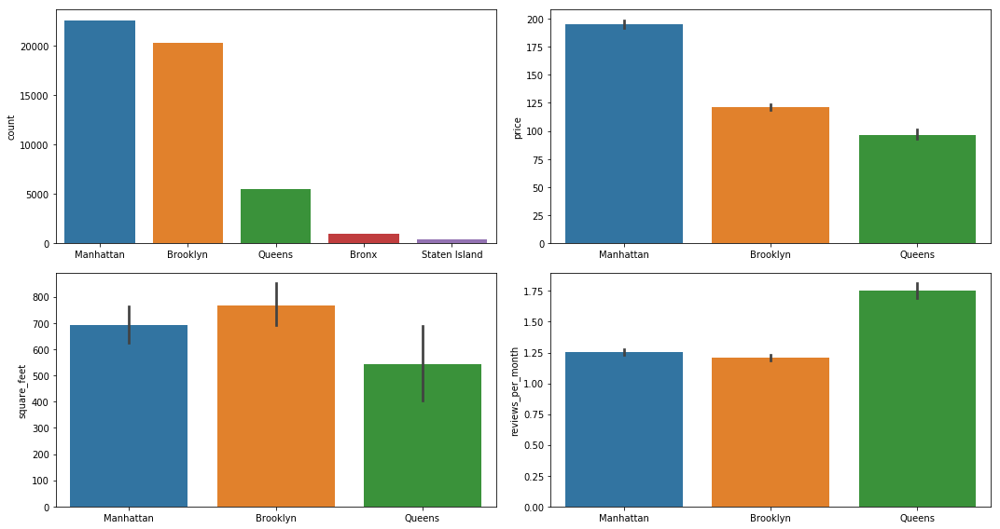

In [7]:
f,ax = plt.subplots(2,2,figsize=(15,8))

dist_list0 = ['Manhattan','Brooklyn','Queens','Bronx','Staten Island']
dist_list = ['Manhattan','Brooklyn','Queens']#,'Bronx','Staten Island']

ax = plt.subplot(2,2,1)
#df_lst['neighbourhood_group_cleansed'].value_counts().plot(kind='bar',ax=ax)
#plt.xticks(rotation=0)
sns.countplot('neighbourhood_group_cleansed',data=df,ax=ax,order=dist_list0)
plt.xlabel('')

ax = plt.subplot(2,2,2)
sns.barplot('neighbourhood_group_cleansed','price',data=df,ax=ax,order=dist_list)
#plt.ylim([0,335])
plt.xlabel('')

ax = plt.subplot(2,2,3)
sns.barplot('neighbourhood_group_cleansed','square_feet',data=df,ax=ax,order=dist_list)
plt.xlabel('')

ax = plt.subplot(2,2,4)
sns.barplot('neighbourhood_group_cleansed','reviews_per_month',data=df,ax=ax,order=dist_list)
#plt.ylim([0,5])
plt.xlabel('')

plt.tight_layout()

##### From above diagrams, I am going to focus on 3 major boroughs, Manhattan, Brooklyn, and Queens, because Bronx and Staten Island have very few resources on Airbnb.

##### In general, a Normal NYC Aibnb Homes is likely to be:
* More expensive in Manhattan;
* Has larger room space in Brooklyn;
* Got more reviews per month in Queens.

In [8]:
price_cut_list = [75,100,125,150,200,300,10000]
cnt_cut_list = [25,50,100,300,800,1500,100000]

color_map = ['#ffeda0','#ffeda0','#fed976','#feb24c','#fd8d3c','#fc4e2a','#e31a1c','#bd0026']

def pick_color(x,cut_list=price_cut_list,color_map=color_map):
    for ind,itm in enumerate(cut_list):
        if itm >= x:
            return color_map[ind]
    return '#444'

In [9]:
df_price = df.groupby(['neighbourhood_group_cleansed','neighbourhood_cleansed'])['price'].describe()[['count','mean','50%']].reset_index()
df_price.sort_values('mean',ascending=False).head()

,neighbourhood_group_cleansed,neighbourhood_cleansed,count,mean,50%
221,Staten Island,Woodrow,1.0,700.000000,700.0
189,Staten Island,Fort Wadsworth,1.0,700.000000,700.0
89,Brooklyn,Sea Gate,6.0,552.666667,174.0
67,Brooklyn,DUMBO,39.0,455.769231,189.0
122,Manhattan,Tribeca,170.0,453.517647,275.0


In [10]:
for ind,i in enumerate(neighbourhoods['features']):
    g1 = i['properties']['neighbourhood_group']
    g2 = i['properties']['neighbourhood']
    
    dft = df_price[(df_price['neighbourhood_group_cleansed']==g1)&(df_price['neighbourhood_cleansed']==g2)]
    if len(dft)>0:
        cnt = dft.iloc[0]['count']
        price = int(dft.iloc[0]['mean'])
    else:
        cnt = 0
        price = 0
        
    neighbourhoods['features'][ind]['properties']['count'] = cnt
    neighbourhoods['features'][ind]['properties']['price'] = price
    
    if cnt <= 25:
        neighbourhoods['features'][ind]['properties']['Color'] = '#444'
    else:
        neighbourhoods['features'][ind]['properties']['Color'] = pick_color(price,price_cut_list,color_map)
        
    neighbourhoods['features'][ind]['properties']['cColor'] = pick_color(cnt,cnt_cut_list,color_map)

In [11]:
def show_map(color_index,neighbourhoods=neighbourhoods):
    mapbox_access_token = 'pk.eyJ1IjoidG1hOTk1IiwiYSI6ImNqdHIyZnJ0bjBmdDY0M3FkajF0aXFvbmgifQ.yxAXJDWAJJUpmdlp-mWGmw'
    sources=[{"type": "FeatureCollection", 'features': [feat]} for feat in neighbourhoods['features']]

    data = [
            go.Scattermapbox(
            lat=['90.697061'],
            lon=['-73.978976'],
            mode='markers',
            marker=go.scattermapbox.Marker(
                size=14
            ),
            text=['Montreal'],
        )
    ]

    layout = go.Layout(
        autosize=True,
        #width=1000,
        height=750,
        hovermode='closest',
        mapbox=go.layout.Mapbox(
            layers=[
                dict(sourcetype = 'geojson',
                         source =sources[k],
                         #below="water",
                         type = 'fill',
                         #color = sources[k],#the list of colors for each shape/layer in choropleth
                         color = sources[k]['features'][0]['properties'][color_index],
                         opacity=0.5,
                        ) for k in range(len(sources))
               ],
            accesstoken=mapbox_access_token,
            bearing=0,
            center=go.layout.mapbox.Center(
                lat=40.697061,
                lon=-73.978976
            ),
            pitch=0,
            zoom=10,
            #style='cjtr8gt4y2pb21fs7nx7iwu5x'
        ),
    )

    return go.Figure(data=data, layout=layout)
    #py.iplot(fig, filename='Multiple Mapbox')

In [12]:
py.iplot(show_map('cColor'), filename='Multiple Mapbox')

##### From the map, it is clear to see areas with different listings:

* Hot area with more listings are located in Midtown and Uptowm Manhattan, as well as Brooklyn neighbourhoods by the east river (i.e.: Williamsberg, Bedford-Stuyvesant).
* Neighbourhoods located in Bronx, Staten Island, and some Queens area which far from city center, have very few listings.

In [13]:
init_notebook_mode(connected=True)
iplot(show_map('cColor'), filename='Multiple Mapbox')

##### Top 10 NYC Neighbourhoods with most Airbnb listings:

In [14]:
df2 = df.groupby(['neighbourhood_group_cleansed','neighbourhood_cleansed'])['price'].describe().sort_values('count',ascending=False)
df2[df2['count']>50][:10]

count        mean  \
neighbourhood_group_cleansed neighbourhood_cleansed                       
Brooklyn                     Williamsburg            4080.0  140.867892   
                             Bedford-Stuyvesant      3699.0  107.386050   
Manhattan                    Harlem                  2752.0  123.312863   
Brooklyn                     Bushwick                2462.0   81.069050   
Manhattan                    Hell's Kitchen          2077.0  205.246509   
                             Upper West Side         2068.0  200.428433   
                             East Village            1908.0  185.529350   
                             Upper East Side         1866.0  177.747588   
                             Midtown                 1628.0  284.737101   
Brooklyn                     Crown Heights           1577.0  108.350032   

                                                            std   min     25%  \
neighbourhood_group_cleansed neighbourhood_cleansed                             
Brooklyn                     Williamsburg            131.880589   0.0   70.00   
                             Bedford-Stuyvesant      158.697099   0.0   52.00   
Manhattan                    Harlem                  195.021625  10.0   65.00   
Brooklyn                     Bushwick                 69.551808   0.0   49.00   
Manhattan                    Hell's Kitchen          164.076228  10.0  115.00   
                             Upper West Side         348.972352   0.0   98.00   
                             East Village            189.520319   0.0  100.00   
                             Upper East Side         141.947818  10.0  105.00   
                             Midtown                 249.877725  30.0  147.25   
Brooklyn                     Crown Heights           110.286564  12.0   55.00   

                                                       50%     75%      max  
neighbourhood_group_cleansed neighbourhood_cleansed                          
Brooklyn                     Williamsburg            100.0  175.00   3270.0  
                             Bedford-Stuyvesant       80.0  125.00   5000.0  
Manhattan                    Harlem                   90.0  135.00   5700.0  
Brooklyn                     Bushwick                 65.0   95.00   2000.0  
Manhattan                    Hell's Kitchen          169.0  245.00   2200.0  
                             Upper West Side         150.0  200.00  10000.0  
                             East Village            150.0  200.00   3750.0  
                             Upper East Side         149.0  200.00   2300.0  
                             Midtown                 200.0  328.25   2500.0  
Brooklyn                     Crown Heights            84.0  125.00   2100.0

In [15]:
py.iplot(show_map('Color'), filename='Multiple Mapbox')

##### From the map, it is also easy to find out the average price differences:

* Areas with less than 25 istings are not colored;
* Locations in Midtown and Downtown Manhattan are more expensive than others;

In [16]:
iplot(show_map('Color'), filename='Multiple Mapbox')

##### Top 10 NYC Neighbourhoods with most expensive Airbnb Homes:

In [17]:
df2 = df.groupby(['neighbourhood_group_cleansed','neighbourhood_cleansed'])['price'].describe().sort_values('50%',ascending=False)
df2[df2['count']>50][:10]

count        mean  \
neighbourhood_group_cleansed neighbourhood_cleansed                       
Manhattan                    Tribeca                  170.0  453.517647   
                             NoHo                      75.0  310.586667   
                             Flatiron District        108.0  336.203704   
                             Theater District         245.0  274.240816   
                             West Village             812.0  261.924877   
                             SoHo                     393.0  286.605598   
                             Midtown                 1628.0  284.737101   
                             Chelsea                 1184.0  258.333615   
                             Greenwich Village        415.0  247.787952   
                             Battery Park City         70.0  267.657143   

                                                            std   min     25%  \
neighbourhood_group_cleansed neighbourhood_cleansed                             
Manhattan                    Tribeca                 766.529150  60.0  185.50   
                             NoHo                    228.413334  70.0  192.00   
                             Flatiron District       295.556682  65.0  160.00   
                             Theater District        271.519667  40.0  150.00   
                             West Village            264.495650  46.0  150.00   
                             SoHo                    293.672167  10.0  125.00   
                             Midtown                 249.877725  30.0  147.25   
                             Chelsea                 306.812213   0.0  135.75   
                             Greenwich Village       384.287380  46.0  130.00   
                             Battery Park City       448.786250  55.0  112.00   

                                                       50%     75%     max  
neighbourhood_group_cleansed neighbourhood_cleansed                         
Manhattan                    Tribeca                 275.0  450.00  8500.0  
                             NoHo                    250.0  394.50  1795.0  
                             Flatiron District       249.5  395.00  2000.0  
                             Theater District        212.0  302.00  3000.0  
                             West Village            200.0  271.00  4000.0  
                             SoHo                    200.0  315.00  3000.0  
                             Midtown                 200.0  328.25  2500.0  
                             Chelsea                 199.0  279.00  5000.0  
                             Greenwich Village       190.0  250.00  6000.0  
                             Battery Park City       187.5  286.25  3750.0

-----
#### Q1.2: Why Manhattan properties more expensive? Which borough gets higher cost performance? 

In [18]:
df['has_pool'] = df['amenities'].apply(lambda x: 1 if 'pool' in str(x).lower() else 0 )
df['has_wifi'] = df['amenities'].apply(lambda x: 1 if 'wifi' in str(x).lower() else 0 )
df['has_gym'] = df['amenities'].apply(lambda x: 1 if 'gym' in str(x).lower() else 0 )
df['has_laptop_friendly_workspace'] = df['amenities'].apply(lambda x: 1 if 'laptop friendly workspace' in str(x).lower() else 0 )
df['has_tv'] = df['amenities'].apply(lambda x: 1 if 'tv' in str(x).lower() else 0 )
df['has_kitchen'] = df['amenities'].apply(lambda x: 1 if 'kitchen' in str(x).lower() else 0 )
df['has_ac'] = df['amenities'].apply(lambda x: 1 if 'air conditioning' in str(x).lower() else 0 )
df['has_heating'] = df['amenities'].apply(lambda x: 1 if 'heating' in str(x).lower() else 0 )

df['minutes_to_transit'] = df['transit'].str.lower()
df['minutes_to_transit'] = df['minutes_to_transit'].str.extract('(\d+)[-| ]*(min|分)', expand=True)
df['minutes_to_transit'] = df['minutes_to_transit'].apply(lambda x:int(x) if str(x)!='nan' else np.nan)
df[df['minutes_to_transit'].notnull()].groupby('neighbourhood_group_cleansed')['minutes_to_transit'].describe()['50%']

neighbourhood_group_cleansed
Bronx            10.0
Brooklyn         10.0
Manhattan         7.0
Queens           10.0
Staten Island    15.0
Name: 50%, dtype: float64

In [19]:
df_tmp2 = pd.crosstab(df['neighbourhood_group_cleansed'],df['room_type'],margins=True).apply(lambda x:x/x[-1],axis=1)
df_tmp2 = pd.melt(df_tmp2.reset_index(),id_vars=['neighbourhood_group_cleansed'],value_vars=df['room_type'].unique().tolist(),value_name='r')
df_tmp2

,neighbourhood_group_cleansed,room_type,r
0,Bronx,Private room,0.615385
1,Brooklyn,Private room,0.509354
2,Manhattan,Private room,0.359324
3,Queens,Private room,0.601267
4,Staten Island,Private room,0.535613
5,All,Private room,0.453847
6,Bronx,Entire home/apt,0.338661
7,Brooklyn,Entire home/apt,0.471052
8,Manhattan,Entire home/apt,0.619930
9,Queens,Entire home/apt,0.363439


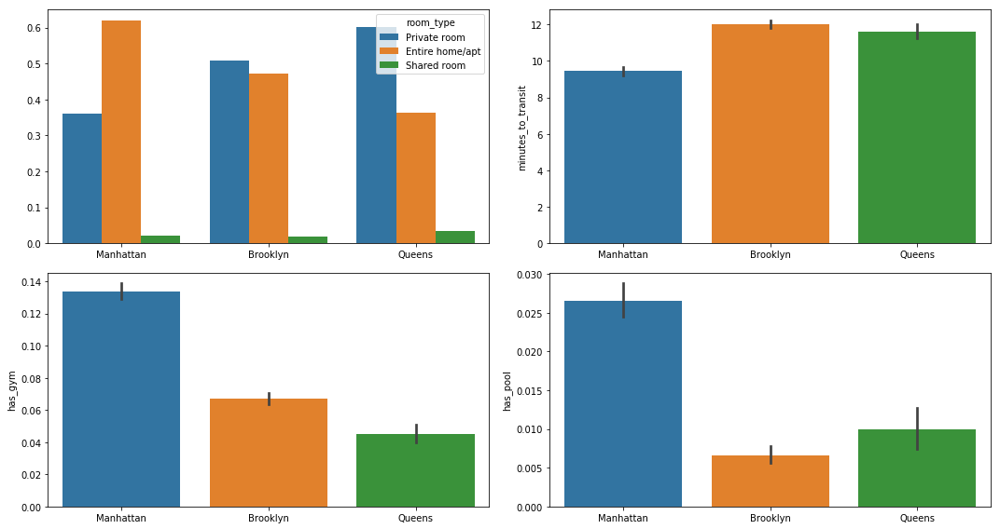

In [20]:
f,ax = plt.subplots(2,2,figsize=(15,8))

ax = plt.subplot(2,2,1)
#df_lst['neighbourhood_group_cleansed'].value_counts().plot(kind='bar',ax=ax)
#plt.xticks(rotation=0)
sns.barplot('neighbourhood_group_cleansed','r',hue='room_type',data=df_tmp2,ax=ax,order=dist_list)
plt.ylabel('')
plt.xlabel('')

ax = plt.subplot(2,2,2)
sns.barplot('neighbourhood_group_cleansed','minutes_to_transit',data=df,ax=ax,order=dist_list)
#plt.ylim([0,35])
plt.xlabel('')

ax = plt.subplot(2,2,3)
sns.barplot('neighbourhood_group_cleansed','has_gym',data=df,ax=ax,order=dist_list)
plt.xlabel('')

ax = plt.subplot(2,2,4)
sns.barplot('neighbourhood_group_cleansed','has_pool',data=df,ax=ax,order=dist_list)
#plt.ylim([0,5])
plt.xlabel('')

plt.tight_layout()

##### From above charts, we get an impression that properties in Manhattan are Luxury.

* Manhattan has larger propotion **'Entire home/apt'** properties other than Private room or Shared room;
* It is generally more convenient to get any point of interest(i.e.: transit stop, subway station) if living in Manhattan;
* Properties in Manhattan are more like to provide amenities as GYM and Pool.

##### Luxury does not equal to `higher cost performance`, below are Top 10 NYC neighbourhoods with highest customer review score ratings:

In [21]:
df2 = df.groupby(['neighbourhood_group_cleansed','neighbourhood_cleansed'])['review_scores_rating'].describe().sort_values('mean',ascending=False)
df2[df2['count']>50][:10]

count       mean  \
neighbourhood_group_cleansed neighbourhood_cleansed                     
Brooklyn                     Brooklyn Heights        120.0  96.125000   
                             Boerum Hill             154.0  96.084416   
                             Prospect Heights        302.0  96.046358   
                             Cobble Hill              85.0  96.035294   
                             Windsor Terrace         130.0  95.838462   
                             Fort Greene             373.0  95.836461   
                             South Slope             242.0  95.768595   
                             Bay Ridge               104.0  95.586538   
                             Greenpoint              857.0  95.367561   
                             Park Slope              422.0  95.360190   

                                                          std   min   25%  \
neighbourhood_group_cleansed neighbourhood_cleansed                         
Brooklyn                     Brooklyn Heights        5.750502  60.0  95.0   
                             Boerum Hill             5.763250  60.0  94.0   
                             Prospect Heights        4.802875  70.0  94.0   
                             Cobble Hill             6.802393  60.0  95.0   
                             Windsor Terrace         4.939642  70.0  94.0   
                             Fort Greene             6.170304  40.0  94.0   
                             South Slope             7.245271  20.0  94.0   
                             Bay Ridge               6.122711  78.0  93.0   
                             Greenpoint              7.504144  20.0  94.0   
                             Park Slope              7.207025  20.0  94.0   

                                                      50%    75%    max  
neighbourhood_group_cleansed neighbourhood_cleansed                      
Brooklyn                     Brooklyn Heights        98.0  100.0  100.0  
                             Boerum Hill             98.0  100.0  100.0  
                             Prospect Heights        98.0  100.0  100.0  
                             Cobble Hill             99.0  100.0  100.0  
                             Windsor Terrace         97.0  100.0  100.0  
                             Fort Greene             98.0  100.0  100.0  
                             South Slope             97.0  100.0  100.0  
                             Bay Ridge               98.0  100.0  100.0  
                             Greenpoint              98.0  100.0  100.0  
                             Park Slope              97.0  100.0  100.0

### Q2: How much time in advance should I book an Airbnb if planing to visit NYC?

In [22]:
df_cal = pd.merge(df_cal,df_lst[['id','neighbourhood_group_cleansed','neighbourhood_cleansed','room_type']],how='left',left_on='listing_id',right_on='id')
df_cal['is_man'] = df_cal['neighbourhood_group_cleansed'].apply(lambda x:1 if x=='Manhattan' else 0)
df_cal['date'] = pd.to_datetime(df_cal['date'])
df_cal['dow'] = df_cal['date'].dt.dayofweek
df_cal['price'] = df_cal['price'].apply(lambda x:np.nan if str(x).lower()=='nan' else float(str(x).replace(',','').replace('$','')))
df_cal['adjusted_price'] = df_cal['adjusted_price'].apply(lambda x:np.nan if str(x).lower()=='nan' else float(str(x).replace(',','').replace('$','')))
df_cal.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights,id,neighbourhood_group_cleansed,neighbourhood_cleansed,room_type,is_man,dow
0,36647,2019-03-07,f,69.0,69.0,2.0,730.0,36647,Manhattan,East Harlem,Private room,1,3
1,36647,2019-03-08,f,69.0,69.0,2.0,730.0,36647,Manhattan,East Harlem,Private room,1,4
2,36647,2019-03-09,f,69.0,69.0,2.0,730.0,36647,Manhattan,East Harlem,Private room,1,5
3,36647,2019-03-10,f,69.0,69.0,2.0,730.0,36647,Manhattan,East Harlem,Private room,1,6
4,36647,2019-03-11,f,69.0,69.0,2.0,730.0,36647,Manhattan,East Harlem,Private room,1,0


In [23]:
df_cal.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18158277 entries, 0 to 18158276
Data columns (total 13 columns):
listing_id                      int64
date                            datetime64[ns]
available                       object
price                           float64
adjusted_price                  float64
minimum_nights                  float64
maximum_nights                  float64
id                              int64
neighbourhood_group_cleansed    object
neighbourhood_cleansed          object
room_type                       object
is_man                          int64
dow                             int64
dtypes: datetime64[ns](1), float64(4), int64(4), object(4)
memory usage: 1.9+ GB


In [24]:
df5 = df_cal.groupby(['date','available']).describe()['adjusted_price'].reset_index()
df5 = df5[(df5['date']<df5['date'].max())&(df5['date']>df5['date'].min())]
df5.head()

,date,available,count,mean,std,min,25%,50%,75%,max
2,2019-03-07,f,40131.0,133.291346,204.238779,0.0,60.0,99.0,155.0,10000.0
3,2019-03-07,t,9616.0,167.969114,275.690914,10.0,69.0,110.0,190.0,9999.0
4,2019-03-08,f,39234.0,136.452694,207.472014,0.0,64.0,100.0,160.0,10000.0
5,2019-03-08,t,10513.0,172.258252,279.719072,11.0,69.0,115.0,199.0,9999.0
6,2019-03-09,f,38893.0,136.971434,204.373069,0.0,65.0,100.0,160.0,10000.0


##### Do not book an Airbnb too early:

* From below chart, lots of host owners updated their properties in a 90-day or 180-day range.
* If you book too early, you may miss many decent properties because they are not open for booking yet.

Text(0.5, 1.0, 'Total NYC Airbnb Home count')

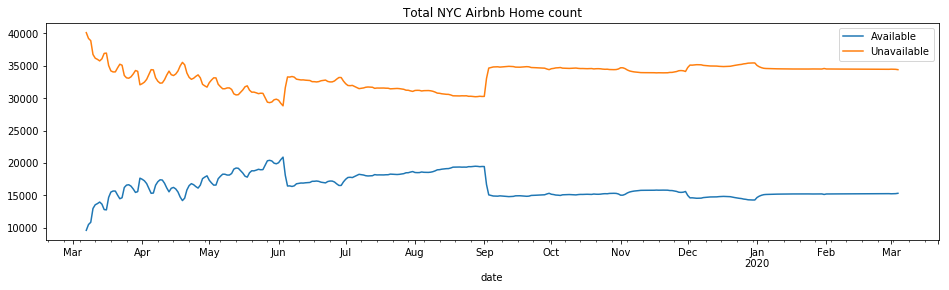

In [25]:
f,ax = plt.subplots(figsize=(16,4))
df5[(df5['available']=='t')].plot('date','count',ax=ax,label='Available')
df5[(df5['available']=='f')].plot('date','count',ax=ax,label='Unavailable')
plt.title('Total NYC Airbnb Home count')

In [26]:
df4 = df_cal.groupby(['date','available','is_man']).describe()['adjusted_price'].reset_index()
df4 = df4[(df4['date']>df4['date'].min())&(df4['date']<pd.to_datetime('2019-06-05'))]
df4.head()

,date,available,is_man,count,mean,std,min,25%,50%,75%,max
4,2019-03-07,f,0,22006.0,104.449650,176.670310,10.0,50.0,77.0,125.0,10000.0
5,2019-03-07,f,1,18125.0,168.308745,228.537123,0.0,85.0,129.0,199.0,10000.0
6,2019-03-07,t,0,5182.0,122.364145,195.720168,10.0,55.0,83.0,135.0,8000.0
7,2019-03-07,t,1,4434.0,221.267479,338.836663,11.0,99.0,159.0,249.0,9999.0
8,2019-03-08,f,0,21226.0,107.142420,195.097410,10.0,50.0,80.0,125.0,10000.0


Text(0.5, 1.0, 'NYC Airbnb Home Average Price (Other Boroughs)')

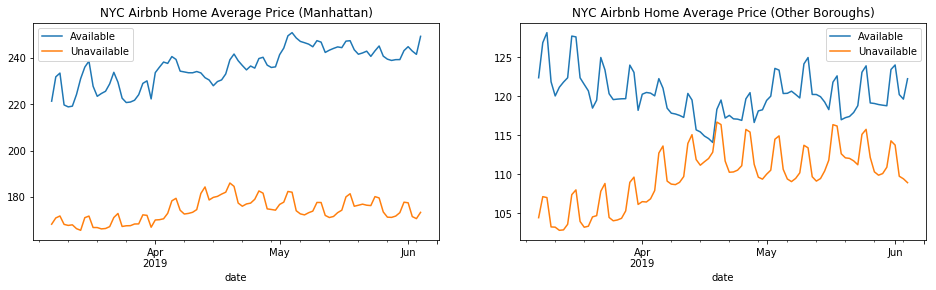

In [27]:
f,ax = plt.subplots(1,2,figsize=(16,4))
ax = plt.subplot(1,2,1)
df4[(df4['available']=='t') & (df4['is_man']==1)].plot('date','mean',ax=ax,label='Available')
df4[(df4['available']=='f') & (df4['is_man']==1)].plot('date','mean',ax=ax,label='Unavailable')
plt.title('NYC Airbnb Home Average Price (Manhattan)')

ax = plt.subplot(1,2,2)
df4[(df4['available']=='t') & (df4['is_man']==0)].plot('date','mean',ax=ax,label='Available')
df4[(df4['available']=='f') & (df4['is_man']==0)].plot('date','mean',ax=ax,label='Unavailable')
plt.title('NYC Airbnb Home Average Price (Other Boroughs)')

##### Book in advance between 30 to 90 days if you plan to live outside Manhattan

* Properties with comfort environment, convenient location, and lower price are always hot and booked by early birds. 
* If you pursue cost performance, Book at least one month before you go (while no more than three month ahead) will give you a better chance;
* For individuals who enjoy quality life, it seems there are always plentiful luxury properties in Manhattan, where book time should not be a problem in this case.

Text(0.5, 1.0, 'NYC Airbnb Home Median Price (Other Boroughs)')

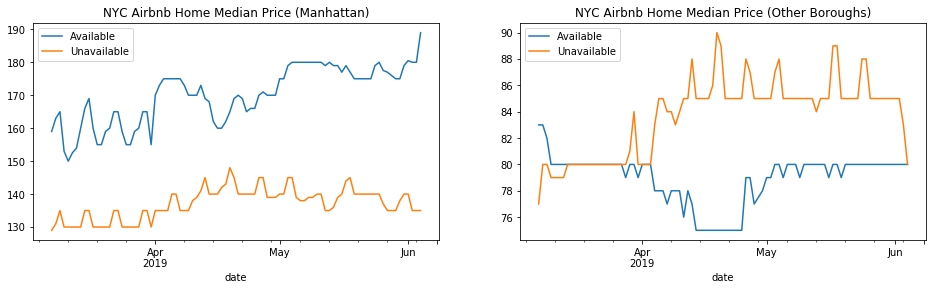

In [28]:
f,ax = plt.subplots(1,2,figsize=(16,4))
ax = plt.subplot(1,2,1)
df4[(df4['available']=='t') & (df4['is_man']==1)].plot('date','50%',ax=ax,label='Available')
df4[(df4['available']=='f') & (df4['is_man']==1)].plot('date','50%',ax=ax,label='Unavailable')
plt.title('NYC Airbnb Home Median Price (Manhattan)')

ax = plt.subplot(1,2,2)
df4[(df4['available']=='t') & (df4['is_man']==0)].plot('date','50%',ax=ax,label='Available')
df4[(df4['available']=='f') & (df4['is_man']==0)].plot('date','50%',ax=ax,label='Unavailable')
plt.title('NYC Airbnb Home Median Price (Other Boroughs)')

-----
### Data wrangling before modeling

* Drop useless columns;
* Convert **`string`** values to **`int`** if needed; (i.e.: price)
* Extract usefull info from text columns into separate columns; (i.e.: transit, amenities)
* Find all **`category`** columns and apply one-hot encoding;
* Delete outlier data based on label column(price).

In [29]:
na_df = pd.concat([pd.DataFrame(df.dtypes),pd.DataFrame(df.isnull().mean().sort_values())],axis=1).reset_index()
na_df.columns = ['feature','dtype','na_rate']
na_df.sort_values('na_rate')

,feature,dtype,na_rate
101,room_type,object,0.000000
32,has_laptop_friendly_workspace,int64,0.000000
33,has_pool,int64,0.000000
34,has_tv,int64,0.000000
35,has_wifi,int64,0.000000
85,number_of_reviews,int64,0.000000
102,scrape_id,int64,0.000000
83,neighbourhood_group_cleansed,object,0.000000
39,host_id,int64,0.000000
82,neighbourhood_cleansed,object,0.000000


In [30]:
df = df.drop(na_df[na_df['na_rate']>0.25]['feature'].tolist(),axis=1) #null
df = df.drop(['host_id','id','scrape_id'],axis=1) #int
df = df.drop(['latitude','longitude'],axis=1) # float

In [31]:
df['host_verifications'] = df['host_verifications'].apply(lambda x: eval(x) if x!='None' else eval('[]'))
df['host_verifications'] = df['host_verifications'].apply(lambda x: len(x))

In [32]:
category_list = ['bed_type','cancellation_policy','host_identity_verified','host_is_superhost',
                 'instant_bookable','is_location_exact','neighbourhood_cleansed',
                 'neighbourhood_group_cleansed','property_type','room_type'
                ]

for i in category_list:
    df[i] = df[i].astype('category')

In [33]:
tmp_dt = datetime.datetime.strptime('2019-03-06',"%Y-%m-%d")
df['host_since'] = df['host_since'].apply(lambda x:(tmp_dt-datetime.datetime.strptime(x,"%Y-%m-%d")).days if str(x)!='nan' else np.nan)

In [34]:
df.dtypes.unique()

array([dtype('O'), dtype('float64'),
       CategoricalDtype(categories=['f', 't'], ordered=False),
       dtype('int64'),
       CategoricalDtype(categories=['Allerton', 'Arden Heights', 'Arrochar', 'Arverne',
                  'Astoria', 'Bath Beach', 'Battery Park City', 'Bay Ridge',
                  'Bay Terrace', 'Bay Terrace, Staten Island',
                  ...
                  'Westerleigh', 'Whitestone', 'Williamsbridge',
                  'Williamsburg', 'Willowbrook', 'Windsor Terrace',
                  'Woodhaven', 'Woodlawn', 'Woodrow', 'Woodside'],
                 ordered=False),
       CategoricalDtype(categories=['Bronx', 'Brooklyn', 'Manhattan', 'Queens', 'Staten Island'], ordered=False),
       CategoricalDtype(categories=['Aparthotel', 'Apartment', 'Bed and breakfast', 'Boat',
                  'Boutique hotel', 'Bungalow', 'Bus', 'Cabin', 'Camper/RV',
                  'Casa particular (Cuba)', 'Castle', 'Cave', 'Condominium',
                  'Cottage', 'Dome

In [35]:
df.select_dtypes(include=['int','float','category']).columns

Index(['host_since', 'host_is_superhost', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_identity_verified', 'neighbourhood_cleansed',
       'neighbourhood_group_cleansed', 'is_location_exact', 'property_type',
       'room_type', 'accommodates', 'bathrooms', 'bedrooms', 'beds',
       'bed_type', 'price', 'guests_included', 'minimum_nights',
       'maximum_nights', 'minimum_minimum_nights', 'maximum_minimum_nights',
       'minimum_maximum_nights', 'maximum_maximum_nights',
       'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'availability_30',
       'availability_60', 'availability_90', 'availability_365',
       'number_of_reviews', 'number_of_reviews_ltm', 'review_scores_rating',
       'review_scores_accuracy', 'review_scores_cleanliness',
       'review_scores_checkin', 'review_scores_communication',
       'review_scores_location', 'review_scores_value', 'instant_bookable',
       'cancellation_policy', 'calculated_host_lis

In [36]:
df1 = df[df.select_dtypes(include=['int','float','category']).columns]
df1 = pd.get_dummies(df1)
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49748 entries, 0 to 49747
Columns: 327 entries, host_since to cancellation_policy_super_strict_60
dtypes: float64(17), int64(27), uint8(283)
memory usage: 30.1 MB


In [37]:
sp = df1['price'].describe()
sp

count    49748.000000
mean       150.931796
std        225.025933
min          0.000000
25%         69.000000
50%        107.000000
75%        175.000000
max      10000.000000
Name: price, dtype: float64

In [38]:
ubound = 1.5*(sp['75%']-sp['25%'])+sp['75%']
ubound

334.0

In [39]:
df1 = df1[df1['price']<ubound]
y = df1['price']
X = df1.drop(['price'], axis=1)
print(X.shape, y.shape)

(46748, 326) (46748,)


-----
## 4. Modeling

* Xgboost is used in this project;

In [40]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42, test_size=0.2)
X_train.shape,X_test.shape

((37398, 326), (9350, 326))

In [41]:
clf = XGBRegressor(n_estimators=100)

In [42]:
%%time
clf.fit(X_train, 
        y_train, 
        eval_metric='rmse', 
        verbose=True, 
        eval_set=[(X_test, y_test)], 
        early_stopping_rounds=50
       )

[0]	validation_0-rmse:125.377
Will train until validation_0-rmse hasn't improved in 50 rounds.
[1]	validation_0-rmse:114.833
[2]	validation_0-rmse:105.518
[3]	validation_0-rmse:97.3246
[4]	validation_0-rmse:90.112
[5]	validation_0-rmse:83.775
[6]	validation_0-rmse:78.2562
[7]	validation_0-rmse:73.4713
[8]	validation_0-rmse:69.3324
[9]	validation_0-rmse:65.7316
[10]	validation_0-rmse:62.6549
[11]	validation_0-rmse:60.011
[12]	validation_0-rmse:57.7531
[13]	validation_0-rmse:55.7529
[14]	validation_0-rmse:54.1056
[15]	validation_0-rmse:52.6804
[16]	validation_0-rmse:51.4658
[17]	validation_0-rmse:50.4504
[18]	validation_0-rmse:49.5848
[19]	validation_0-rmse:48.7853
[20]	validation_0-rmse:48.161
[21]	validation_0-rmse:47.6467
[22]	validation_0-rmse:47.1127
[23]	validation_0-rmse:46.6716
[24]	validation_0-rmse:46.3332
[25]	validation_0-rmse:46.0266
[26]	validation_0-rmse:45.7629
[27]	validation_0-rmse:45.5355
[28]	validation_0-rmse:45.2424
[29]	validation_0-rmse:45.0627
[30]	validation_0-r

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=1)

-----
## 5. Evaluation

In [43]:
clf.get_params()

{'base_score': 0.5,
 'booster': 'gbtree',
 'colsample_bylevel': 1,
 'colsample_bytree': 1,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_delta_step': 0,
 'max_depth': 3,
 'min_child_weight': 1,
 'missing': None,
 'n_estimators': 100,
 'n_jobs': 1,
 'nthread': None,
 'objective': 'reg:linear',
 'random_state': 0,
 'reg_alpha': 0,
 'reg_lambda': 1,
 'scale_pos_weight': 1,
 'seed': None,
 'silent': True,
 'subsample': 1}

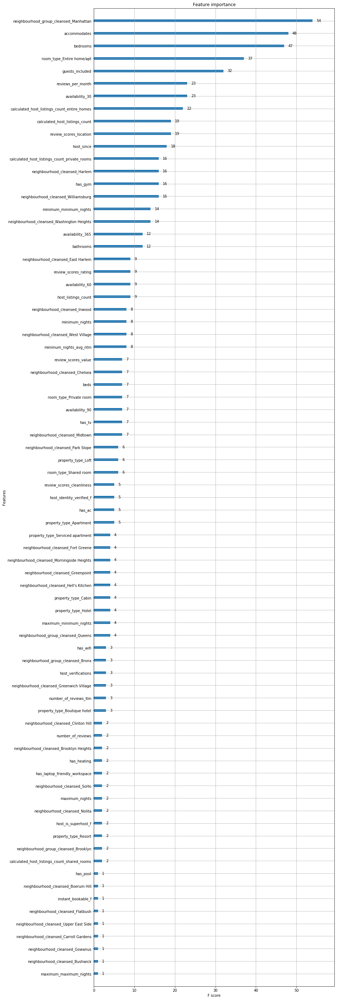

In [44]:
fig,ax=plt.subplots(figsize=(12,50))
xgboost.plot_importance(clf,ax=ax)

-----
## 6. Model Explaining

* **shap** is used for interpreting above trained model and analyzing feature impact on price.

In [45]:
shap.initjs()

In [46]:
explainer = shap.TreeExplainer(clf)
explainer.expected_value

array([1.1909186])

In [47]:
p_df = pd.DataFrame()
p_df['pred'] = clf.predict(X_test)
p_df['price'] = y_test.reset_index(drop=True)
p_df['mae'] = p_df[['pred','price']].apply(lambda x:abs(x[1]-x[0]),axis=1)
p_df[p_df['mae']<5].head()

,pred,price,mae
20,39.067116,35.0,4.067116
48,88.141220,89.0,0.858780
49,38.660217,35.0,3.660217
63,97.807716,100.0,2.192284
77,113.327637,113.0,0.327637


In [48]:
shap_values = explainer.shap_values(X_test)

### Q3. What are the key features that affects the price?

According to below summary plot, most important key features are:

* **Room Type**: whether the given property is rent for entire home/apt brings largest difference on price;
* **Location**: properties generlly located in `Manhattan` or `Williamsburg,Brooklyn` will give positive effects on price, while outlying areas like `Harlem` and `Washington Heights` have negative effects on price;
* **Infrastructure**: properties with more accomodates, bedrooms, bathrooms, with amenities like GYM, TV, Air Conditioning will charge you more;
* **Customer Review**: while not as much as above 3 factors, relatively low customer rating does give some negitive force on price.

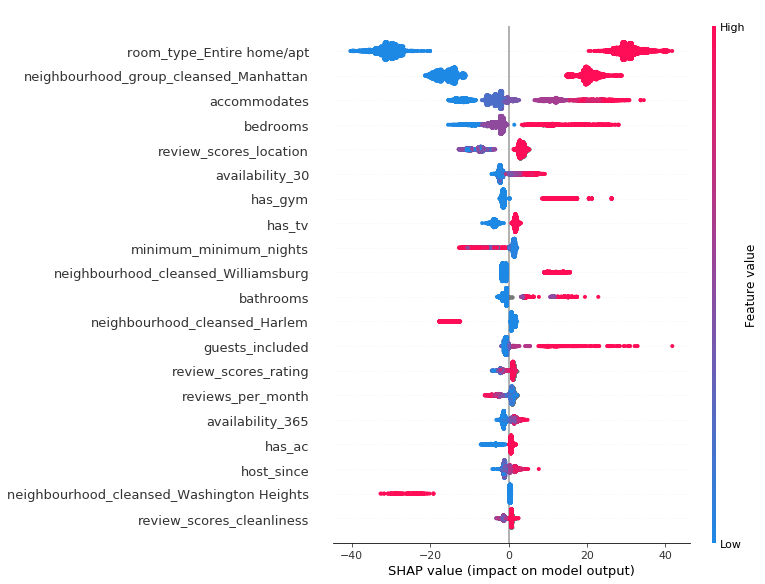

In [49]:
shap.summary_plot(shap_values, X_test)

##### Example 1: 

* Positive force: Ignorable;
* Negative force: Not entire apt, Not located in Manhattan, Relatively low customer review score on location(9), Without a TV in the room;
* Predicted price: Around 50;

In [50]:
shap.force_plot(explainer.expected_value, shap_values[101,:], X_test.iloc[101,:])

##### Example 2: 
* Positive force: Entire apt, Relatively high accomodates, Good location: Greenpoint Brooklyn, Perfect customer review score on location(10);
* Negative force: Not located in Manhattan, Only one bedrooms, Without TV in the room;
* Predicted price: 133;

In [51]:
shap.force_plot(explainer.expected_value, shap_values[16,:], X_test.iloc[16,:])

##### Example 3: 
* Positive force: Entire apt, Relatively high accomodates, Luxury location: Chelsea Manhattan;
* Negative force: Ignorable;
* Predicted price: 228;

In [52]:
shap.force_plot(explainer.expected_value, shap_values[9307,:], X_test.iloc[9307,:])

In [53]:
shap.force_plot(explainer.expected_value, explainer.shap_values(X_test[:30]), X_test[:30])

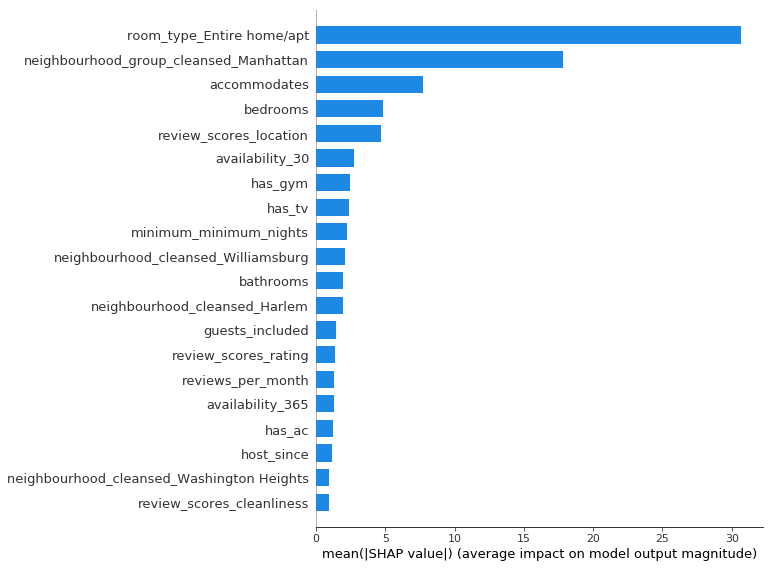

In [54]:
shap.summary_plot(shap_values, X_test, plot_type="bar")